# **Training HRPlane Dataset with YOLOv8l: Experiment No. 28**

<p align="center">
    <img src="https://github.com/RSandAI/Comprehensive-YOLO-Airplane-Detection/blob/main/assets/image.png" height=450 width=1280 alt=""/>
</p>

<small>Picture Source: <a href="https://github.com/RSandAI/Comprehensive-YOLO-Airplane-Detection/">RSandAI, Comprehensive YOLO Airplane Detection</a></small>

<br>

## **Context**

The HRPlanes dataset is a valuable resource in the domain of computer vision, particularly for tasks related to object detection, specifically focusing on aircraft within Very High Resolution (VHR) Google Earth images. This dataset comprises 3101 RGB images of major airports and aircraft boneyards, manually annotated with bounding boxes for airplanes using Plainsight (formerly HyperLabel). Quality control was conducted independently, resulting in 18,477 annotated airplanes. The dataset is split into 70% training (2170 images), 20% validation (620 images), and 10% testing (311 images) sets.

<br>

To facilitate accurate training and evaluation, each aircraft within the images has been meticulously labeled, resulting in a comprehensive annotation set covering a total of 18,477 aircraft instances. These annotations provide bounding box coordinates for each detected aircraft within the corresponding images.

<br>

Given the specifics of the HRPlanes dataset and its annotations, training object detection models like YOLOv8 would involve leveraging this rich dataset to teach the model to accurately detect and localize aircraft within VHR Google Earth images. This process would entail feeding the dataset into the YOLOv8 model architecture and iteratively training the model until satisfactory performance metrics are achieved. Access to the HRPlanes dataset provides researchers, practitioners, and developers with a valuable asset for advancing the state-of-the-art in aircraft detection algorithms, with potential applications spanning aviation security, urban planning, and defense intelligence. The dataset's availability ensures its accessibility to the wider computer vision community, fostering collaboration and innovation in this domain.

**Hyperparameters:**

| Epochs | Network size | Batch size | LR | Optimizer | Hue | Saturation | Value | Mosiac |
|--|--|--|--|--|--|--|--|--|
| 100 | 960x960 | 16 | 0.001 | Adam | 0.015 | 0.7 | 0.4 | 1.0 |

<br>

Make sure your runtime is **GPU** (_not_ CPU or TPU). And if it is an option, make sure you are using _Python 3_. You can select these settings by going to `Runtime -> Change runtime type -> Select the above mentioned settings and then press SAVE`.

## **0. Initial Steps**

### **0.1 Download Library**

In [ ]:
!pip install ultralytics -q

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.2/755.2 kB 4.4 MB/s eta 0:00:00


### **0.2. Import Libraries and Connect Google Drive**

In [ ]:
from google.colab import drive
drive.mount('/gdrive')

Mounted at /gdrive


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pandas as pd
import numpy as np
import json
import shutil
import seaborn as sns
import os
from ultralytics import YOLO

### **0.3. Define Paths and Hyperparameters**

In [ ]:
# @markdown ---

BASE_DIRECTORY = '/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8l/Experiment_No_28/' # @param {type:"string"}
if os.path.exists(BASE_DIRECTORY):
    print(f"Base directory already exists: {BASE_DIRECTORY}")
else:
    os.makedirs(BASE_DIRECTORY)
    print(f"Created base directory: {BASE_DIRECTORY}")

SAVE_DIR = BASE_DIRECTORY + 'outputs'
if os.path.exists(SAVE_DIR):
    print(f"Save directory already exists: {SAVE_DIR}")
else:
    os.makedirs(SAVE_DIR)
    print(f"Created save directory: {SAVE_DIR}")

# @markdown ---

IMAGE_SIZE = 960 # @param {type:"integer"}
BATCH = 16 # @param {type:"integer"}
LR = 0.001 # @param {type:"number"}
OPTIMIZER = 'Adam' # @param {type:"string"}

# @markdown ---

HUE = 0.015 # @param {type:"number"}
SATURATION = 0.7 # @param {type:"number"}
VALUE = 0.4 # @param {type:"number"}
MOSIAC = 1.0 # @param {type:"number"}

# @markdown ---

Created base directory: /gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8l/Experiment_No_28/
Created save directory: /gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8l/Experiment_No_28/outputs


## **1. Train the Model**

The A100 GPU is a powerful graphics processing unit (GPU) developed by NVIDIA. It is part of the NVIDIA Ampere architecture and is designed for high-performance computing tasks, including deep learning, data analytics, and scientific computing. The A100 GPU offers significant improvements in performance and efficiency compared to previous GPU models, making it ideal for demanding AI and machine learning applications.

In [ ]:
!nvidia-smi

Sat May  4 07:30:47 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P0              46W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

### **1.1. Train Model**

YOLOv8l refers to a variant of the YOLO (You Only Look Once) object detection model, specifically based on the YOLOv4 architecture. YOLOv4 is a state-of-the-art deep learning model used for real-time object detection tasks. The "l" in YOLOv8l typically denotes an extended or modified version of the original model, possibly with improvements or adjustments.

In [ ]:
model = YOLO('/gdrive/MyDrive/Datasets/HRPlanes_ds/yolov8l.pt')

In [ ]:
%load_ext tensorboard

In [ ]:
results = model.train(data='/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/coco.yaml', epochs=100, imgsz=IMAGE_SIZE, batch=BATCH, lr0=LR, optimizer=OPTIMIZER, hsv_h=HUE, hsv_s=SATURATION, hsv_v=VALUE, mosaic=MOSIAC)

Ultralytics YOLOv8.2.8 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
engine/trainer: task=detect, mode=train, model=/gdrive/MyDrive/Datasets/HRPlanes_ds/yolov8l.pt, data=/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/coco.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=960, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=Adam, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False,

100%|██████████| 755k/755k [00:00<00:00, 17.7MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 81.2MB/s]


AMP: checks passed ✅


train: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/train/labels.cache... 2170 images, 4 backgrounds, 0 corrupt: 100%|██████████| 2170/2170 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
val: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/val/labels.cache... 620 images, 5 backgrounds, 0 corrupt: 100%|██████████| 620/620 [00:00<?, ?it/s]


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: Adam(lr=0.001, momentum=0.937) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 960 train, 960 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      22.3G     0.8854     0.6769      1.077         72        960: 100%|██████████| 136/136 [03:41<00:00,  1.63s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:06<00:00,  2.91it/s]

                   all        620       3290      0.968      0.949      0.981      0.789



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      23.8G     0.8165     0.4705      1.063        173        960: 100%|██████████| 136/136 [01:45<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.90it/s]


                   all        620       3290      0.963      0.937      0.972       0.75

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100        23G      0.806     0.4686      1.055         99        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.22it/s]


                   all        620       3290      0.966      0.951      0.983      0.789

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      23.4G     0.8049     0.4523      1.049        115        960: 100%|██████████| 136/136 [01:48<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.20it/s]

                   all        620       3290      0.979      0.959      0.987      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      23.1G     0.7772     0.4289      1.042         89        960: 100%|██████████| 136/136 [01:49<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.27it/s]

                   all        620       3290      0.979      0.947      0.979      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      22.7G     0.7481     0.4078      1.019        100        960: 100%|██████████| 136/136 [01:48<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.20it/s]

                   all        620       3290      0.975      0.968      0.989      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100        23G     0.7433     0.4034      1.012         90        960: 100%|██████████| 136/136 [01:47<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.15it/s]

                   all        620       3290      0.978      0.966      0.988       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100        23G     0.7295     0.3909      1.008        111        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.47it/s]


                   all        620       3290      0.375      0.788       0.35       0.28

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      23.1G     0.7237     0.3833      1.011        121        960: 100%|██████████| 136/136 [01:46<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.26it/s]

                   all        620       3290      0.984      0.977      0.993      0.818



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      22.9G     0.7102     0.3777      1.005        103        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.12it/s]

                   all        620       3290      0.985      0.971      0.991      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100        23G     0.7105     0.3647      1.002         67        960: 100%|██████████| 136/136 [01:50<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.23it/s]

                   all        620       3290      0.987      0.973      0.992      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      23.2G     0.7054      0.358     0.9868         75        960: 100%|██████████| 136/136 [01:46<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.24it/s]

                   all        620       3290      0.983      0.981      0.993      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100        23G     0.6941     0.3599     0.9876         87        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.20it/s]

                   all        620       3290      0.979      0.982      0.992      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      22.9G     0.6874     0.3588     0.9847        103        960: 100%|██████████| 136/136 [01:46<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.14it/s]

                   all        620       3290      0.981      0.981      0.993      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      23.4G     0.6752     0.3463     0.9778         99        960: 100%|██████████| 136/136 [01:47<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.22it/s]

                   all        620       3290      0.982      0.985      0.992      0.839



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      23.2G     0.6805     0.3454     0.9874         96        960: 100%|██████████| 136/136 [01:47<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.28it/s]

                   all        620       3290      0.981      0.986      0.992      0.849



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      22.9G     0.6715     0.3446     0.9708        128        960: 100%|██████████| 136/136 [01:46<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.28it/s]

                   all        620       3290      0.985      0.979      0.993       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      22.4G     0.6652      0.338     0.9695         89        960: 100%|██████████| 136/136 [01:49<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.13it/s]

                   all        620       3290      0.986      0.984      0.993      0.856



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      23.2G     0.6519     0.3301     0.9685        116        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.21it/s]

                   all        620       3290      0.979      0.984      0.993      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      23.2G     0.6556     0.3297     0.9577        207        960: 100%|██████████| 136/136 [01:47<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.04it/s]

                   all        620       3290      0.984      0.984      0.993      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      22.9G     0.6456     0.3244     0.9563         85        960: 100%|██████████| 136/136 [01:49<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.17it/s]

                   all        620       3290      0.986      0.986      0.993      0.855



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      22.9G      0.648     0.3324     0.9594         93        960: 100%|██████████| 136/136 [01:43<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290      0.988      0.986      0.993      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      22.9G     0.6503     0.3261     0.9606         67        960: 100%|██████████| 136/136 [01:46<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.22it/s]

                   all        620       3290      0.989      0.982      0.993       0.85



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      22.9G     0.6424     0.3204     0.9641        182        960: 100%|██████████| 136/136 [02:10<00:00,  1.04it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.49it/s]

                   all        620       3290      0.985      0.988      0.993      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      22.6G     0.6295     0.3199     0.9491        102        960: 100%|██████████| 136/136 [01:43<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.14it/s]

                   all        620       3290      0.987      0.984      0.993      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      22.9G     0.6419     0.3154     0.9563        136        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.29it/s]

                   all        620       3290      0.988      0.988      0.993      0.853



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      22.5G     0.6456     0.3199     0.9626        101        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.14it/s]

                   all        620       3290      0.985      0.987      0.993      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      22.3G     0.6274     0.3121     0.9594        149        960: 100%|██████████| 136/136 [02:02<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.23it/s]

                   all        620       3290      0.987      0.984      0.993      0.863



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100        23G     0.6275     0.3111     0.9473        117        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290      0.988      0.989      0.993      0.859



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      23.3G     0.6132     0.3078      0.939         77        960: 100%|██████████| 136/136 [01:48<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290      0.988      0.986      0.993      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      23.2G       0.62     0.3033     0.9537        120        960: 100%|██████████| 136/136 [01:43<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.38it/s]

                   all        620       3290      0.988      0.988      0.993      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      22.7G     0.6128      0.307     0.9496         96        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.26it/s]

                   all        620       3290      0.989      0.985      0.993      0.858



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100        23G     0.6091     0.2996     0.9393        104        960: 100%|██████████| 136/136 [01:43<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.15it/s]

                   all        620       3290      0.987      0.987      0.993      0.851



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      22.9G     0.6179     0.3033     0.9396         72        960: 100%|██████████| 136/136 [01:48<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.15it/s]

                   all        620       3290      0.989      0.992      0.994      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      22.8G     0.6109      0.299     0.9356        121        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.12it/s]

                   all        620       3290      0.983      0.991      0.993      0.869



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      23.2G     0.6088     0.2992     0.9466         98        960: 100%|██████████| 136/136 [01:48<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.34it/s]

                   all        620       3290      0.985      0.991      0.994      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      22.8G     0.5973      0.296     0.9336        209        960: 100%|██████████| 136/136 [01:48<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.21it/s]

                   all        620       3290      0.989      0.991      0.993       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100        23G     0.5975     0.2933     0.9397        135        960: 100%|██████████| 136/136 [02:02<00:00,  1.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.23it/s]

                   all        620       3290      0.989      0.991      0.994      0.868



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100        23G     0.5977     0.2955     0.9383         85        960: 100%|██████████| 136/136 [01:48<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290      0.987       0.99      0.993      0.861



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100        23G     0.5961     0.2912     0.9373        122        960: 100%|██████████| 136/136 [01:45<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.18it/s]

                   all        620       3290      0.988      0.988      0.993      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100        24G     0.5937     0.2905     0.9335         77        960: 100%|██████████| 136/136 [01:46<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.03it/s]

                   all        620       3290       0.99       0.99      0.994      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      23.7G     0.5886     0.2911     0.9439         85        960: 100%|██████████| 136/136 [01:43<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.11it/s]

                   all        620       3290      0.988      0.989      0.993      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      23.9G     0.5804     0.2874     0.9331         82        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290      0.986      0.993      0.994      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      22.9G     0.5836     0.2827     0.9362         96        960: 100%|██████████| 136/136 [01:48<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.13it/s]

                   all        620       3290       0.99      0.984      0.994      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      22.9G     0.5838     0.2861     0.9364         71        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.18it/s]

                   all        620       3290      0.989      0.992      0.993      0.872



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100        23G     0.5812     0.2851     0.9275        238        960: 100%|██████████| 136/136 [01:48<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.17it/s]

                   all        620       3290      0.988      0.991      0.994      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      24.1G     0.5837     0.2805      0.929        113        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290      0.986      0.991      0.993      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      22.9G     0.5798     0.2806      0.924         86        960: 100%|██████████| 136/136 [01:44<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.10it/s]

                   all        620       3290      0.988      0.994      0.994      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      22.9G     0.5746     0.2806     0.9284         72        960: 100%|██████████| 136/136 [01:48<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.17it/s]

                   all        620       3290      0.983      0.995      0.993       0.87



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      23.1G     0.5747     0.2795     0.9304         66        960: 100%|██████████| 136/136 [01:44<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.24it/s]

                   all        620       3290      0.988      0.989      0.994      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      22.9G     0.5763     0.2776     0.9244         98        960: 100%|██████████| 136/136 [01:53<00:00,  1.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.31it/s]

                   all        620       3290      0.991       0.99      0.994      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      22.9G     0.5686     0.2694     0.9302        109        960: 100%|██████████| 136/136 [01:46<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.15it/s]

                   all        620       3290      0.989      0.989      0.994      0.873



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      22.6G     0.5665     0.2706     0.9249         94        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.35it/s]

                   all        620       3290      0.991       0.99      0.994      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      22.9G     0.5676     0.2741      0.919         57        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.21it/s]

                   all        620       3290      0.988      0.991      0.994      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      23.1G     0.5569     0.2714     0.9202        163        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.14it/s]

                   all        620       3290      0.987      0.992      0.994      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      22.5G     0.5648     0.2695     0.9187         89        960: 100%|██████████| 136/136 [01:47<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.23it/s]

                   all        620       3290      0.989      0.991      0.994      0.875



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      22.9G     0.5483     0.2637      0.916        129        960: 100%|██████████| 136/136 [01:46<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290      0.991      0.988      0.994      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      22.9G      0.561     0.2732     0.9204        141        960: 100%|██████████| 136/136 [01:49<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.11it/s]

                   all        620       3290      0.988      0.993      0.994      0.879



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      22.9G     0.5498      0.267     0.9167        118        960: 100%|██████████| 136/136 [01:49<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.13it/s]

                   all        620       3290       0.99      0.992      0.994      0.877



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      23.3G     0.5435      0.261     0.9103         82        960: 100%|██████████| 136/136 [01:48<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.27it/s]

                   all        620       3290      0.992      0.989      0.994      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100        23G     0.5492     0.2655     0.9153         56        960: 100%|██████████| 136/136 [02:04<00:00,  1.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.16it/s]

                   all        620       3290      0.992       0.99      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      22.8G     0.5437     0.2611     0.9128         67        960: 100%|██████████| 136/136 [01:43<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.06it/s]

                   all        620       3290      0.989      0.993      0.994      0.874



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      23.1G     0.5518     0.2641     0.9175        142        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.14it/s]

                   all        620       3290       0.99      0.995      0.994      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100        23G     0.5373     0.2574      0.913        137        960: 100%|██████████| 136/136 [01:48<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.09it/s]

                   all        620       3290       0.99      0.992      0.994      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100        23G     0.5414     0.2555     0.9098         88        960: 100%|██████████| 136/136 [01:50<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.17it/s]

                   all        620       3290       0.99      0.992      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100        23G     0.5384     0.2563     0.9118         71        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.18it/s]

                   all        620       3290      0.992      0.991      0.994      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      23.3G     0.5368     0.2573     0.8999        131        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.27it/s]

                   all        620       3290      0.993      0.988      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      22.9G     0.5284     0.2512     0.8946         72        960: 100%|██████████| 136/136 [01:57<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290       0.99      0.991      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100        23G     0.5281      0.252     0.8926        119        960: 100%|██████████| 136/136 [01:46<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.09it/s]

                   all        620       3290       0.99      0.992      0.994      0.876



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      23.6G     0.5372     0.2548     0.9052        110        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.20it/s]

                   all        620       3290      0.989      0.992      0.994      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      22.6G     0.5358     0.2554     0.9041        124        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.99it/s]

                   all        620       3290       0.99       0.99      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100        23G      0.523     0.2481     0.9034        122        960: 100%|██████████| 136/136 [02:06<00:00,  1.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.36it/s]

                   all        620       3290       0.99      0.992      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      22.9G     0.5115     0.2429     0.8982         81        960: 100%|██████████| 136/136 [01:46<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.34it/s]

                   all        620       3290      0.989      0.991      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      22.7G     0.5085     0.2473     0.8941         96        960: 100%|██████████| 136/136 [01:47<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.18it/s]

                   all        620       3290      0.987      0.993      0.994      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100        23G     0.5098      0.243     0.8945        131        960: 100%|██████████| 136/136 [01:57<00:00,  1.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.23it/s]

                   all        620       3290      0.988      0.993      0.994      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100        23G     0.5173     0.2462     0.8903         69        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.09it/s]

                   all        620       3290      0.988      0.993      0.994      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      23.3G     0.5116     0.2433     0.8865        237        960: 100%|██████████| 136/136 [01:55<00:00,  1.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.29it/s]

                   all        620       3290      0.986      0.994      0.994       0.88



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      23.4G     0.4965     0.2328      0.885        133        960: 100%|██████████| 136/136 [01:44<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.25it/s]

                   all        620       3290      0.989      0.991      0.994      0.882



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      23.1G     0.5053     0.2414      0.892         77        960: 100%|██████████| 136/136 [01:46<00:00,  1.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.13it/s]

                   all        620       3290      0.989      0.992      0.994      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      23.2G     0.5016      0.236     0.8924        116        960: 100%|██████████| 136/136 [01:49<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.25it/s]

                   all        620       3290      0.986      0.994      0.994      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      22.9G     0.4925     0.2334     0.8829         87        960: 100%|██████████| 136/136 [01:47<00:00,  1.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.20it/s]

                   all        620       3290      0.987      0.992      0.994      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      23.2G     0.4963     0.2342     0.8859        157        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.01it/s]

                   all        620       3290      0.989      0.992      0.994      0.889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100        23G     0.4839     0.2277     0.8884        118        960: 100%|██████████| 136/136 [01:56<00:00,  1.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.23it/s]

                   all        620       3290      0.993      0.989      0.994      0.892



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      23.3G     0.4856     0.2307     0.8847         89        960: 100%|██████████| 136/136 [01:42<00:00,  1.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.25it/s]

                   all        620       3290      0.991      0.991      0.994      0.885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      22.9G     0.4878     0.2264     0.8826         86        960: 100%|██████████| 136/136 [01:54<00:00,  1.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.33it/s]

                   all        620       3290      0.991       0.99      0.994      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      23.1G     0.4805     0.2247     0.8772         88        960: 100%|██████████| 136/136 [01:52<00:00,  1.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.16it/s]

                   all        620       3290      0.991      0.991      0.994      0.888



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      22.5G     0.4817     0.2274     0.8856        101        960: 100%|██████████| 136/136 [01:44<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.14it/s]

                   all        620       3290      0.989      0.993      0.994      0.883



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      23.1G     0.4843      0.228     0.8858         88        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.38it/s]

                   all        620       3290      0.992      0.992      0.994      0.887



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      23.1G     0.4773     0.2219     0.8805        120        960: 100%|██████████| 136/136 [01:44<00:00,  1.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.21it/s]

                   all        620       3290      0.991      0.992      0.994      0.891



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100        23G     0.4682     0.2158     0.8759        130        960: 100%|██████████| 136/136 [01:51<00:00,  1.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.27it/s]

                   all        620       3290      0.991      0.992      0.994      0.889


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      23.1G     0.4652     0.2055     0.8839         79        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.21it/s]

                   all        620       3290      0.988      0.993      0.994      0.893



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100        23G      0.453     0.2001     0.8747         49        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.17it/s]

                   all        620       3290      0.991      0.992      0.994      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      23.2G     0.4448     0.1951     0.8703         35        960: 100%|██████████| 136/136 [01:47<00:00,  1.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.13it/s]

                   all        620       3290      0.992      0.992      0.994      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      22.9G     0.4478     0.1967     0.8754         45        960: 100%|██████████| 136/136 [01:48<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.19it/s]

                   all        620       3290      0.992      0.991      0.994      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100        23G     0.4407     0.1922     0.8677         91        960: 100%|██████████| 136/136 [01:49<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.15it/s]

                   all        620       3290      0.991      0.992      0.994      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      22.9G     0.4392     0.1937     0.8679         37        960: 100%|██████████| 136/136 [01:43<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.41it/s]

                   all        620       3290      0.992      0.993      0.994      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      23.3G     0.4368     0.1921     0.8668         66        960: 100%|██████████| 136/136 [01:58<00:00,  1.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.18it/s]

                   all        620       3290      0.992      0.993      0.994      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      23.3G      0.434     0.1898      0.865         27        960: 100%|██████████| 136/136 [01:45<00:00,  1.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.21it/s]

                   all        620       3290      0.992      0.993      0.994      0.899



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      23.1G     0.4289     0.1868     0.8678         61        960: 100%|██████████| 136/136 [01:49<00:00,  1.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:04<00:00,  4.17it/s]

                   all        620       3290      0.992      0.993      0.994        0.9



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      22.9G     0.4293     0.1887     0.8641         71        960: 100%|██████████| 136/136 [01:44<00:00,  1.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:05<00:00,  3.98it/s]

                   all        620       3290      0.991      0.993      0.994      0.899



100 epochs completed in 3.287 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 87.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 87.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics YOLOv8.2.8 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:25<00:00,  1.29s/it]


                   all        620       3290      0.992      0.993      0.994        0.9
Speed: 0.2ms preprocess, 3.0ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs/detect/train


### **1.2. Monitor Training with TensorBoard**


TensorBoard is a powerful visualization tool designed for TensorFlow, a popular open-source machine learning framework developed by Google. It provides a suite of visualization tools to help you understand, debug, and optimize your TensorFlow programs.

In [ ]:
# %tensorboard --logdir {BASE_DIRECTORY}

In [ ]:
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

## **2. Evaluate Model**

In [ ]:
model = YOLO(f"runs/detect/train/weights/best.pt")
metrics = model.val()

Ultralytics YOLOv8.2.8 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (NVIDIA A100-SXM4-40GB, 40514MiB)
Model summary (fused): 268 layers, 43607379 parameters, 0 gradients, 164.8 GFLOPs


val: Scanning /gdrive/MyDrive/Datasets/HRPlanes_ds/val/labels.cache... 620 images, 5 backgrounds, 0 corrupt: 100%|██████████| 620/620 [00:00<?, ?it/s]
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:28<00:00,  1.39it/s]


                   all        620       3290      0.992      0.993      0.994      0.902
Speed: 0.2ms preprocess, 5.9ms inference, 0.0ms loss, 5.1ms postprocess per image
Results saved to runs/detect/val


### **2.1 Monitor Box Metrics**

In [ ]:
# @markdown Run this code block to monitor **box** metrics.

attributes = [
    ('metrics.box.map50', 'Mean Average Precision at IoU threshold of 0.5 for all classes.'),
    ('metrics.box.map75', 'Mean Average Precision at IoU threshold of 0.75 for all classes.'),
    ('metrics.box.ap', 'Average Precision at IoU thresholds from 0.5 to 0.95 for all classes.'),
    ('metrics.box.mp', 'Mean Precision of all classes.'),
    ('metrics.box.mr', 'Mean Recall of all classes.'),
    # ('metrics.box.mean_results', 'Mean of results, returns Mean Precision, Mean Recall, Mean Average Precision at IoU threshold of 0.5, Mean Average Precision at IoU threshold of 0.5 to 0.95.'),
    ('metrics.box.p', 'Precision for each class.'),
    ('metrics.box.r', 'Recall for each class.'),
    ('metrics.box.f1', 'F1 score for each class.'),
    ('metrics.box.nc', 'Number of classes.')
]

for attr, explanation in attributes:
    value = getattr(metrics.box, attr.split('.')[-1])
    if isinstance(value, np.ndarray):
        value = np.float64(value[0])
    print(f'{attr}: {value:.4f} - {explanation}')

with open(f"{BASE_DIRECTORY}outputs/attributes.json", "w") as f:
    json.dump(attributes, f)

box_metrics_dict = {}
for attr, explanation in attributes:
    value = getattr(metrics.box, attr.split('.')[-1])
    if isinstance(value, np.ndarray):
        value = np.float64(value[0])
    box_metrics_dict[attr] = {
        "value": value,
        "description": explanation
    }

with open(f"{BASE_DIRECTORY}outputs/box_metrics.json", "w") as f:
    json.dump(box_metrics_dict, f)

metrics.box.map50: 0.9940 - Mean Average Precision at IoU threshold of 0.5 for all classes.
metrics.box.map75: 0.9879 - Mean Average Precision at IoU threshold of 0.75 for all classes.
metrics.box.ap: 0.9018 - Average Precision at IoU thresholds from 0.5 to 0.95 for all classes.
metrics.box.mp: 0.9915 - Mean Precision of all classes.
metrics.box.mr: 0.9928 - Mean Recall of all classes.
metrics.box.p: 0.9915 - Precision for each class.
metrics.box.r: 0.9928 - Recall for each class.
metrics.box.f1: 0.9921 - F1 score for each class.
metrics.box.nc: 1.0000 - Number of classes.


### **2.2 Monitor Best Metrics**

In [ ]:
# @markdown Run this block to monitor **best** metrics.

for key, value in metrics.results_dict.items():
    if key == 'metrics/precision(B)':
        print(f'Precision: {value:.4f} - Percentage of correct positive predictions.')
    elif key == 'metrics/recall(B)':
        print(f'Recall: {value:.4f} - Percentage of actual positives that were correctly predicted.')
    elif key == 'metrics/mAP50(B)':
        print(f'mAP50: {value:.4f} - Mean Average Precision at 50% IOU.')
    elif key == 'metrics/mAP50-95(B)':
        print(f'mAP50-95: {value:.4f} - Mean Average Precision between 50% and 95% IOU.')
    # else:
    #     print(f'{key}: {value:.4f}')

precision = metrics.results_dict['metrics/precision(B)']
recall = metrics.results_dict['metrics/recall(B)']
f1_score = 2 * (precision * recall) / (precision + recall)

print(f'F1 Score: {f1_score:.4f} - Harmonic mean of precision and recall.')

metrics_dict = {}
for key, value in metrics.results_dict.items():
    attribute = next((desc for attr, desc in attributes if attr == key), None)
    metrics_dict[key] = {
        "value": value,
        "description": attribute if attribute is not None else "No description available"
    }

with open(f"{BASE_DIRECTORY}outputs/metrics.json", "w") as f:
    json.dump(metrics_dict, f)

Precision: 0.9915 - Percentage of correct positive predictions.
Recall: 0.9928 - Percentage of actual positives that were correctly predicted.
mAP50: 0.9940 - Mean Average Precision at 50% IOU.
mAP50-95: 0.9018 - Mean Average Precision between 50% and 95% IOU.
F1 Score: 0.9921 - Harmonic mean of precision and recall.


### **2.3. Plot Confusion Matrix and Calculate Overall Accuracy**

In [ ]:
def calculate_accuracy(TP, FN, FP):

    accuracy = (TP) / (TP + FN + FP)

    return accuracy

In [ ]:
cm = metrics.confusion_matrix.matrix

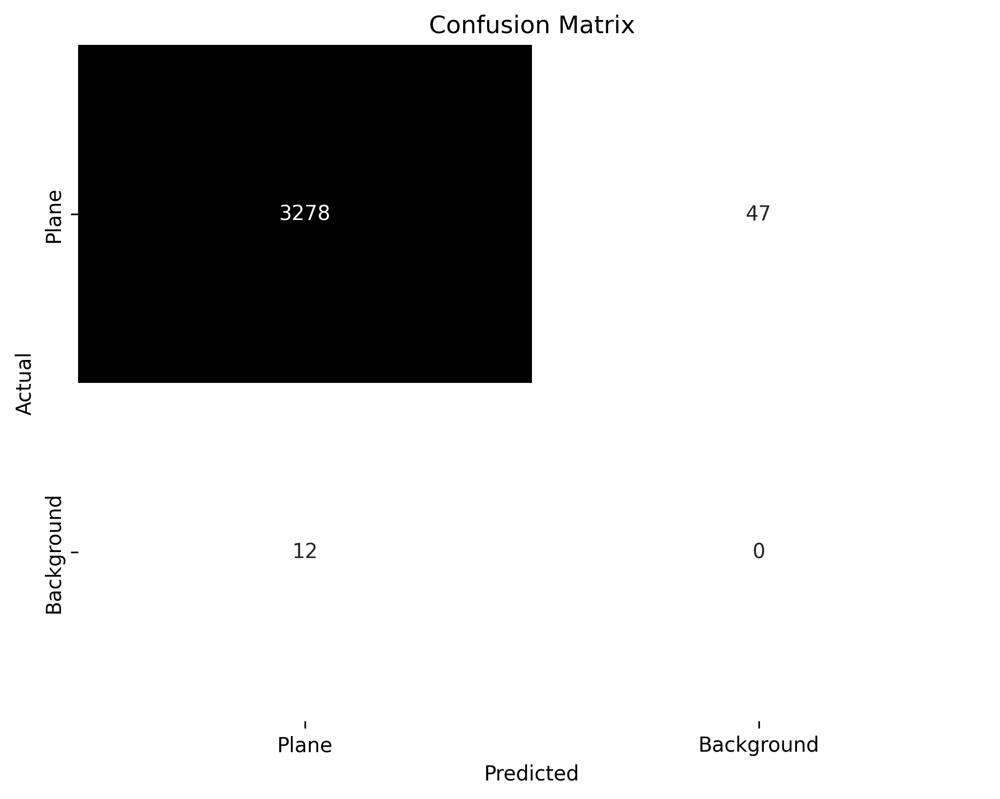

In [ ]:
plt.figure(figsize=(8, 6), dpi=300)
sns.heatmap(cm.astype(int), annot=True, fmt='d', cmap='Greys', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.xticks(ticks=[0.5, 1.5], labels=['Plane', 'Background'])
plt.yticks(ticks=[0.5, 1.5], labels=['Plane', 'Background'])
plt.savefig(f"{BASE_DIRECTORY}/outputs/confusion_matrix_customized.png")
plt.show()

In [ ]:
TP = int(cm[0][0])
FN = int(cm[1][0])
FP = int(cm[0][1])

accuracy = calculate_accuracy(TP, FN, FP)

print("Accuracy:", round(accuracy, 4))

Accuracy: 0.9823


### **2.4. Plot Best Results**

**mAP50 (mean Average Precision at 50)** is a metric commonly used in object detection tasks, including those using YOLO (You Only Look Once) models like YOLOv8l. It calculates the average precision of detecting objects across different categories at a specific intersection over union (IoU) threshold of 0.5.

<br>

**mAP50-95 (mean Average Precision from 50 to 95)** is an extension of mAP50 that calculates the average precision over a range of IoU thresholds, typically from 0.5 to 0.95, with a step size of 0.05. This metric provides a more comprehensive evaluation of the model's performance across a wider range of IoU thresholds, capturing its ability to detect objects with varying levels of overlap with ground truth annotations.

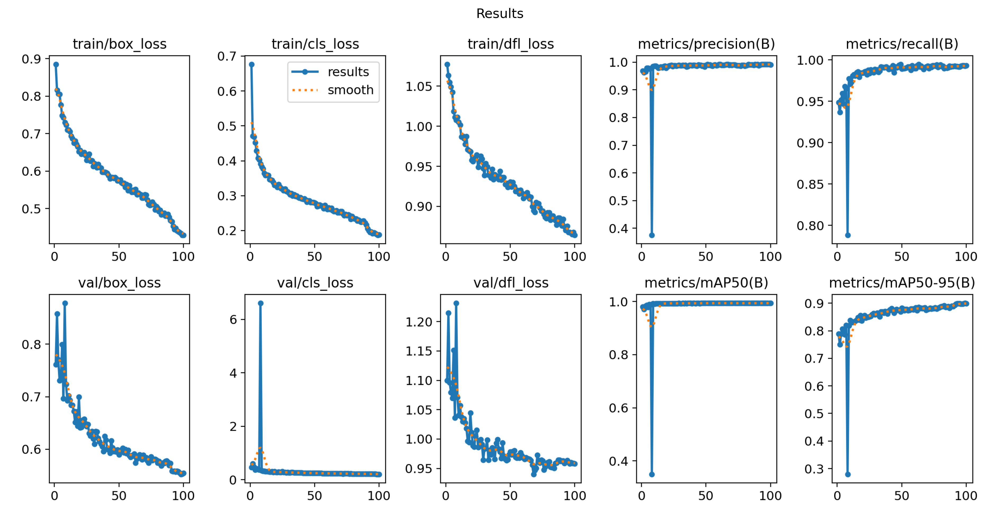

In [ ]:
image = mpimg.imread(f"/content/runs/detect/train/results.png")
plt.figure(figsize=(16, 9), dpi=300)
plt.title('Results')
plt.imshow(image)
plt.axis('off')
plt.show()

In [ ]:
csv_file_path = f"/content/runs/detect/train/results.csv"
df = pd.read_csv(csv_file_path)
df

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,0.88539,0.67693,1.07750,0.96774,0.94863,0.98082,0.78852,0.76156,0.46449,1.09970,0.067243,0.000331,0.000331
1,2,0.81654,0.47054,1.06340,0.96252,0.93661,0.97171,0.75007,0.85781,0.60948,1.21510,0.034236,0.000658,0.000658
2,3,0.80599,0.46859,1.05470,0.96553,0.95137,0.98310,0.78948,0.77056,0.48787,1.09590,0.001223,0.000978,0.000978
3,4,0.80488,0.45233,1.04940,0.97922,0.95942,0.98718,0.80666,0.73107,0.37987,1.07980,0.000970,0.000970,0.000970
4,5,0.77723,0.42892,1.04230,0.97925,0.94667,0.97897,0.80350,0.73302,0.42656,1.06990,0.000960,0.000960,0.000960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,96,0.43921,0.19365,0.86792,0.99240,0.99261,0.99376,0.89779,0.55729,0.21357,0.95802,0.000060,0.000060,0.000060
96,97,0.43678,0.19212,0.86684,0.99210,0.99297,0.99380,0.89812,0.55538,0.21337,0.96027,0.000050,0.000050,0.000050
97,98,0.43396,0.18982,0.86495,0.99189,0.99301,0.99388,0.89893,0.55243,0.21100,0.95906,0.000040,0.000040,0.000040
98,99,0.42893,0.18683,0.86780,0.99150,0.99276,0.99395,0.90049,0.55261,0.21002,0.95872,0.000030,0.000030,0.000030


### **2.5. Plot Labels and Predicted Results**

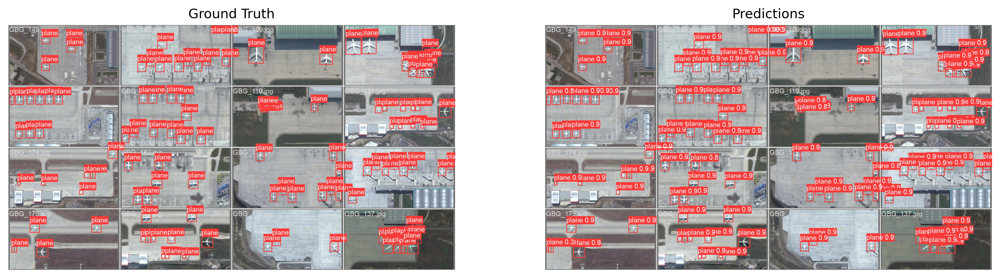

In [ ]:
image1 = mpimg.imread(f"/content/runs/detect/val/val_batch0_labels.jpg")
image2 = mpimg.imread(f"/content/runs/detect/val/val_batch0_pred.jpg")

fig, axes = plt.subplots(1, 2, figsize=(16, 9), dpi=300)
axes[0].imshow(image1)
axes[0].set_title('Ground Truth')
axes[0].axis('off')
axes[1].imshow(image2)
axes[1].set_title('Predictions')
axes[1].axis('off')
plt.savefig(f"{BASE_DIRECTORY}/outputs/label_pred.png")
plt.show()

## **3. Move Model Items into Google Drive**

Instead of uploading and downloading files, we can directly move them to the desired path.

In [ ]:
shutil.move("/content/runs/detect/", BASE_DIRECTORY)

'/gdrive/MyDrive/Datasets/HRPlanes/YOLOV8/YOLOv8l/Experiment_No_28/detect'

In [ ]:
from datetime import datetime
print(f"Changes have been made to the project on {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Changes have been made to the project on 2024-05-04 10:50:08
Changes have been made to the project on 2024-05-04 10:50:08
